# SIT744 Assignment 2: Deep Learning Project 

<div class="alert-info">
    <p>Due: <strong>8:00pm 29 May 2022</strong>  (Monday)</p>

This is an <strong>individual</strong> assignment. It contributes <strong>40%</strong> to your final mark. Read the assignment instruction carefully.

<h2> What to submit </h2>

<p>
This assignment is to be completed individually and submitted to CloudDeakin. <strong>By the due date, you are required to submit the following files to the corresponding Assignment (Dropbox) in CloudDeakin</strong>:

<ol>
<li>	<strong>[YourID]_assignment2_solution.ipynb</strong>:  This is your Python notebook solution source file. </li>
<li>	<strong>[YourID]_assingment2_output.html</strong> or <strong>[YourID]_assingment2_output.pdf</strong>: This is the output of your Python notebook solution <emph>exported</emph> in HTML or PDF format.</li>
<li>	Extra files needed to complete your assignment, if any (e.g., images used in your answers).</li>
</ol>
</p>

<p>
For example, if your student ID is: 123456, you will then need to submit the following files:
<ul>
<li> 123456_assignment2_solution.ipynb </li>
<li> 123456_assignment2_output.html</li>
</ul>
</p>

<h2> Warning </h2>

Some components of this assignment may involve heavy computation that runs for a long duration. Please start early to avoid missing the assignment due date.

<h2> Marking criteria </h2>

<p>
Your submission will be assessed based on the overall impact of your effort. A useful model (or application) should be your focus. But as in Assignment 1, we will also consider the following criteria at the same time.

<ul>
<li> Showing good effort through completed tasks.</li>
<li> Applying deep learning theory to design suitable deep learning solutions for the tasks.</li>
<li> Critically evaluating and reflecting on the pros and cons of various design decisions.</li>
<li> Demonstrating creativity and resourcefulness in providing unique individual solutions.</li>
<li> Showing attention to detail through a good quality assignment report.</li>
</ul>
</p>


</div>

## Assignment objective

This assignment is to feedback on your learning in deep learning theory and its application to  data analytics or artificial intelligence problems.  

It builds on Assignment 1 but requires a higher level of mastery of deep learning theory and programming/engineering skills. In particular, you will practice making design decisions yourself. You are also likely to encounter practical issues that will help you consolidate textbook learning. 

## **Task 1 (P Task) Smart Recycling using Deep Learning**

In Assignment 1, you tackled the image classification problem in Fashion-MNIST. There, you used a Densely Connected Neural Network. In Assignment 2, you will apply the best practices of deep-learning computer vision to make something useful for our planet—waste classification.

**Background** Every day, we put things into our recycle bin, to reduce landfill waste. However, we may unintentionally contribute to [recycling contamination](https://www.cleanaway.com.au/sustainable-future/contamination-main/) by "wish recycling" the wrong items. As every city council has slightly different rules for recycling, you will build a technological solution to ensure you only recycle things that are permitted by your local council. More discussions about recycling contamination can be found [here](https://www.cleanup.org.au/recycle).
![Recycling rule of a local council (source: Whitehorse City Council)](https://www.whitehorse.vic.gov.au/sites/whitehorse.vic.gov.au/files/assets/images/Recycle%20Right%20A3%20Poster.jpg "Recycling rule of a local council")

### Task 1.1 Define a problem

Define an image classification problem that may help people better recycle, particularly by reducing contamination.

Describe the desired inputs and outputs, including the target classes.

**Task 1.1 Define a problem**

The image classification problem that can help people better recycle is to classify waste items accurately into their respective recycling categories. This can be achieved by reducing recycling contamination, where incorrect items are mistakenly placed in recycling bins. The goal is to create a technological solution that assists users in correctly identifying which items can be recycled according to their local council's guidelines.

**Inputs and Outputs**

Inputs: The input to the model would be images of waste items that need to be classified. These images can be captured from various sources, such as smartphones or cameras.

Outputs: The model should provide the predicted recycling category for each waste item image. The target classes would be .

### Task 1.2 Make a plan

What dataset can you use to develop a deep learning solution?

How many images do you need? How many for training? How many for testing?

Do you need to label the images yourself?

How do you determine if your model is good enough?

**Task 1.2 Make a plan**

To develop a deep learning solution for waste classification, the following steps can be considered:

1. Dataset Selection: Utilize the "Waste Classification Data" dataset, which contains labeled images of waste items across different recycling categories.

2. Labeling: The dataset already provides labeled images, so there is no need for additional labeling.

3. Model Evaluation: Evaluate the model's performance using appropriate evaluation metrics such as accuracy, precision, recall, and F1-score. These metrics will help determine if the model is performing well enough to classify waste items accurately.

### Task 1.3 Implement a solution

Collect relevant data.
Develop a deep learning model.
Report the model performance against the success criteria that you define.

**Task 1.3 Implement a solution**

1. Data Collection: Download the "Waste Classification Data" dataset from the Kaggle link.

2. Data Preprocessing: Perform necessary preprocessing steps on the images, such as resizing, normalization, and augmentation if required.

3. Model Development: Develop a deep learning model using a convolutional neural network (CNN) architecture suitable for image classification. Consider architectures like ResNet, VGGNet, or InceptionNet, and fine-tune them based on the available dataset size.

4. Training: Train the model using the training set, adjusting hyperparameters like learning rate, batch size, and number of epochs. Monitor the training process for convergence and overfitting.

5. Model Evaluation: Evaluate the trained model using the testing set. Calculate the desired evaluation metrics (accuracy, precision, recall, F1-score) to assess its performance.

6. Fine-tuning: If the model does not meet the desired success criteria, fine-tune the model by experimenting with different architectures, hyperparameters, or data augmentation techniques. Repeat the training and evaluation process until satisfactory results are achieved.

7. Report Results: Document the model's performance against the defined success criteria, including the achieved accuracy and other evaluation metrics. Provide insights into the strengths and limitations of the model, and discuss potential applications and future improvements.

In [1]:
# Importing the required libraries
import matplotlib.pyplot as plt
import matplotlib.image as mpimg
import numpy as np
import cv2
import os
import pandas as pd
import seaborn as sns
import threading
from PIL import Image
import tensorflow as tf

from tensorflow.keras.backend import clear_session
from tensorflow.keras.callbacks import EarlyStopping, ModelCheckpoint
from tensorflow.keras.layers import Dense, Flatten, Dropout, BatchNormalization
from tensorflow.keras.models import Sequential
from tensorflow.keras.optimizers import Adam
from tensorflow.keras.preprocessing.image import ImageDataGenerator
from imblearn.over_sampling import SMOTE
from sklearn.metrics import classification_report, confusion_matrix

In [2]:
train_dir = 'split-waste-dataset/train'
valid_dir = 'split-waste-dataset/valid'
test_dir = 'split-waste-dataset/test'
new_test = "split-waste-dataset/new_test"
IMAGE_SIZE = 224
BATCH_SIZE = 32
class_names = ['battery', 'biological', 'cardboard', 'glass', 'metal', 'paper', 'plastic', 'trash']

In [3]:
gpus = tf.config.experimental.list_physical_devices('GPU')
if gpus:
    try:
        # Restrict TensorFlow to only allocate GPU memory as needed
        for gpu in gpus:
            tf.config.experimental.set_memory_growth(gpu, True)
        logical_gpus = tf.config.experimental.list_logical_devices('GPU')
        print(len(gpus), "Physical GPUs,", len(logical_gpus), "Logical GPUs")
    except RuntimeError as e:
        print(e)

1 Physical GPUs, 1 Logical GPUs


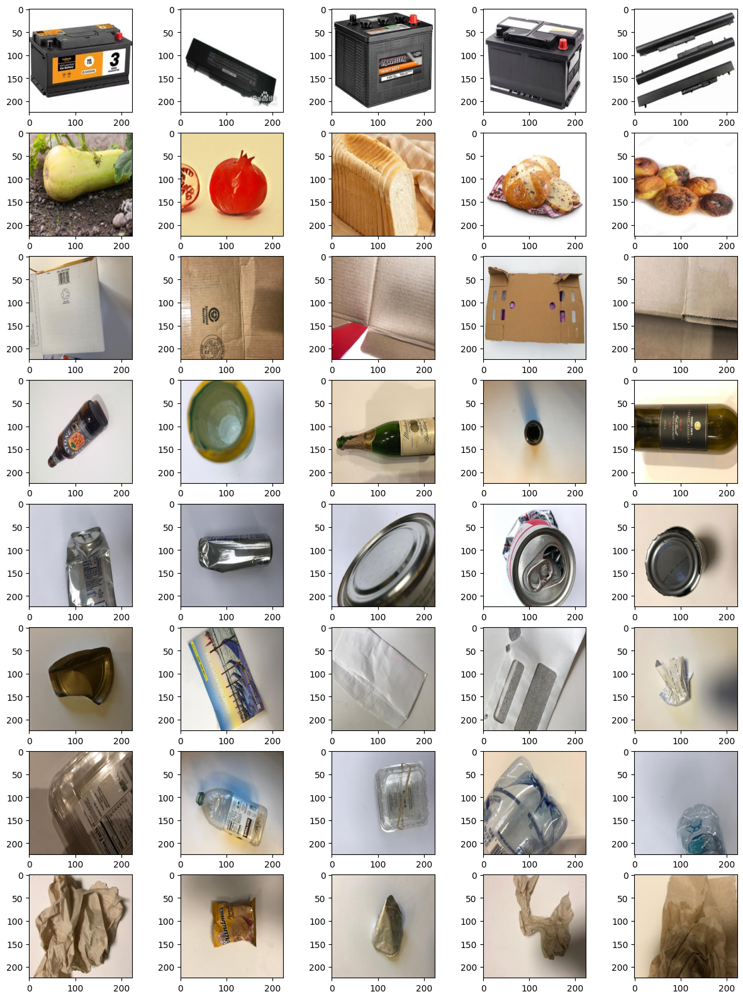

In [3]:
# Plot 5 random images from the training dataset for each class
fig, ax = plt.subplots(8, 5, figsize=(15, 20))

for class_name in os.listdir(train_dir):
    waste_class = os.path.join(train_dir, class_name)
    rand_imgs = np.random.randint(0, len(os.listdir(waste_class)), size=5)
    for i in rand_imgs:
        img = mpimg.imread(os.path.join(waste_class, os.listdir(waste_class)[i]))
        # Resize images
        img = cv2.resize(img, (IMAGE_SIZE, IMAGE_SIZE))
        ax[list(os.listdir(train_dir)).index(class_name), rand_imgs.tolist().index(i)].imshow(img)

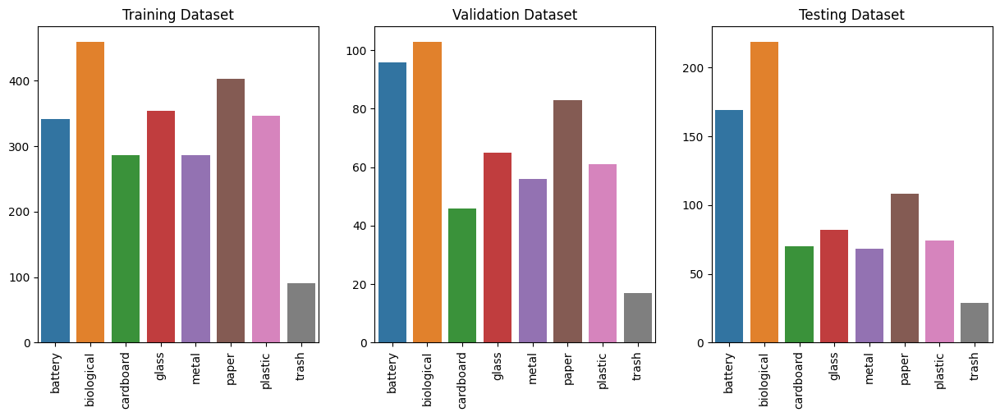

In [4]:
# Plot the number of images in each class for the training, validation and testing datasets
fig, ax = plt.subplots(1, 3, figsize=(15, 5))

sns.barplot(x=list(os.listdir(train_dir)), y=[len(os.listdir(os.path.join(train_dir, i))) for i in os.listdir(train_dir)], ax = ax[0])
ax[0].set_title('Training Dataset')
ax[0].xaxis.set_tick_params(rotation=90)

sns.barplot(x=list(os.listdir(valid_dir)), y=[len(os.listdir(os.path.join(valid_dir, i))) for i in os.listdir(valid_dir)], ax = ax[1])
ax[1].set_title('Validation Dataset')
ax[1].xaxis.set_tick_params(rotation=90)

sns.barplot(x=list(os.listdir(test_dir)), y=[len(os.listdir(os.path.join(test_dir, i))) for i in os.listdir(test_dir)], ax = ax[2])
ax[2].set_title('Testing Dataset')
ax[2].xaxis.set_tick_params(rotation=90)

In [4]:
images = []
y_train = []

for class_name in os.listdir(train_dir):
    waste_class = os.path.join(train_dir, class_name)
    for img_name in os.listdir(waste_class):
        img = cv2.imread(os.path.join(waste_class, img_name))
        img = cv2.resize(img, (IMAGE_SIZE, IMAGE_SIZE))
        img = img / 255.0
        images.append(img)
        y_train.append(class_name)

X_train = np.array(images)
y_train = pd.get_dummies(y_train)

In [5]:
images = []
y_valid = []

for class_name in os.listdir(valid_dir):
    waste_class = os.path.join(valid_dir, class_name)
    for img_name in os.listdir(waste_class):
        img = cv2.imread(os.path.join(waste_class, img_name))
        img = cv2.resize(img, (IMAGE_SIZE, IMAGE_SIZE))
        img = img / 255.0
        images.append(img)
        y_valid.append(class_name)

X_valid = np.array(images)
y_valid = pd.get_dummies(y_valid)

In [6]:
images = []
y_test = []

for class_name in os.listdir(test_dir):
    waste_class = os.path.join(test_dir, class_name)
    for img_name in os.listdir(waste_class):
        img = cv2.imread(os.path.join(waste_class, img_name))
        img = cv2.resize(img, (IMAGE_SIZE, IMAGE_SIZE))
        img = img / 255.0
        images.append(img)
        y_test.append(class_name)

X_test = np.array(images)
y_test = pd.get_dummies(y_test)

In [7]:
# SMOTE oversampling
sm = SMOTE(random_state=42)
X_train, y_train = sm.fit_resample(X_train.reshape(X_train.shape[0], -1), np.argmax(y_train, axis = 1))
y_train = pd.get_dummies(y_train)
# Reshape the data
X_train = X_train.reshape(X_train.shape[0], IMAGE_SIZE, IMAGE_SIZE, 3)

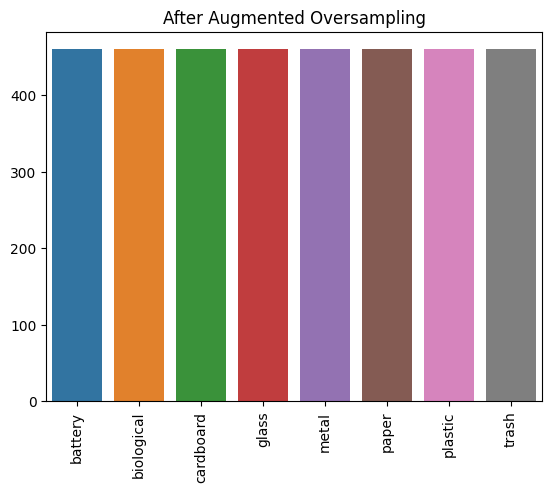

In [9]:
val_count = [os.listdir(train_dir)[i] for i in np.argmax(y_train.values, axis = 1)]
sns.barplot(x = pd.value_counts(val_count).index, y = pd.value_counts(val_count).values)
plt.xticks(rotation = 90)
plt.title('After Augmented Oversampling')
plt.show()

In [8]:
from tensorflow.keras.applications import MobileNetV2

model = Sequential()

# Add the Xception convolutional base model
mobile = MobileNetV2(input_shape=(IMAGE_SIZE, IMAGE_SIZE, 3), 
                     include_top=False,
                     weights='imagenet')

# Freeze the convolutional base
for layer in mobile.layers:
    layer.trainable = False

# Add new layers
model.add(mobile)
model.add(Flatten())
model.add(Dense(256, activation='relu'))
model.add(Dropout(0.25))
model.add(BatchNormalization())
model.add(Dense(64, activation='relu'))
model.add(Dense(8, activation='softmax'))

# Compile the model
model.compile(optimizer=Adam(lr=0.0001), loss='categorical_crossentropy', metrics=['accuracy'])

# Print the model summary
model.summary()

Model: "sequential"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 mobilenetv2_1.00_224 (Funct  (None, 7, 7, 1280)       2257984   
 ional)                                                          
                                                                 
 flatten (Flatten)           (None, 62720)             0         
                                                                 
 dense (Dense)               (None, 256)               16056576  
                                                                 
 dropout (Dropout)           (None, 256)               0         
                                                                 
 batch_normalization (BatchN  (None, 256)              1024      
 ormalization)                                                   
                                                                 
 dense_1 (Dense)             (None, 64)                1

c:\Users\sudak\anaconda3\envs\tf\lib\site-packages\keras\optimizers\optimizer_v2\adam.py:114: UserWarning: The `lr` argument is deprecated, use `learning_rate` instead.
  super().__init__(name, **kwargs)


In [ ]:
model.save_weights('models/Before_training.h5')

In [9]:
callback_1 = EarlyStopping(monitor='val_loss', patience=6, mode='auto')
callback_2 = EarlyStopping(monitor='val_accuracy', patience=6, mode='auto')
callback_3 = ModelCheckpoint(filepath='models/MobileNetv2_model.h5', monitor='val_accuracy', save_best_only=True)

In [10]:
# Clear the session
clear_session()
history = model.fit(
    X_train, y_train,
    validation_data = (X_valid, y_valid),
    epochs = 30,
    callbacks = [callback_1, callback_2, callback_3]
)

clear_session()

Epoch 1/30
115/115 [==============================] - 19s 67ms/step - loss: 0.7270 - accuracy: 0.7560 - val_loss: 0.3961 - val_accuracy: 0.8482
Epoch 2/30
115/115 [==============================] - 5s 40ms/step - loss: 0.1888 - accuracy: 0.9571 - val_loss: 0.3424 - val_accuracy: 0.8937
Epoch 3/30
115/115 [==============================] - 4s 36ms/step - loss: 0.0811 - accuracy: 0.9921 - val_loss: 0.3136 - val_accuracy: 0.8861
Epoch 4/30
115/115 [==============================] - 4s 36ms/step - loss: 0.0421 - accuracy: 0.9957 - val_loss: 0.3514 - val_accuracy: 0.8824
Epoch 5/30
115/115 [==============================] - 4s 36ms/step - loss: 0.0256 - accuracy: 0.9992 - val_loss: 0.3229 - val_accuracy: 0.8843
Epoch 6/30
115/115 [==============================] - 4s 36ms/step - loss: 0.0161 - accuracy: 0.9997 - val_loss: 0.3091 - val_accuracy: 0.8899
Epoch 7/30
115/115 [==============================] - 4s 36ms/step - loss: 0.0139 - accuracy: 0.9992 - val_loss: 0.3184 - val_accuracy: 0.886

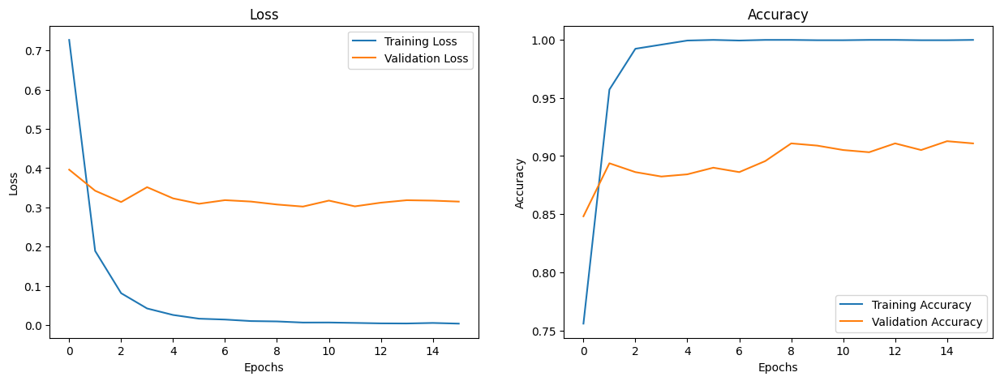

In [11]:
hist = pd.DataFrame(history.history)
hist['epoch'] = history.epoch

# Plotting the loss and accuracy
fig, ax = plt.subplots(1, 2, figsize=(15, 5))

sns.lineplot(x='epoch', y='loss', data=hist, label='Training Loss', ax = ax[0])
sns.lineplot(x='epoch', y='val_loss', data=hist, label='Validation Loss', ax = ax[0])
ax[0].set_title('Loss')
ax[0].set_xlabel('Epochs')
ax[0].set_ylabel('Loss')
ax[0].legend()

sns.lineplot(x='epoch', y='accuracy', data=hist, label='Training Accuracy', ax = ax[1])
sns.lineplot(x='epoch', y='val_accuracy', data=hist, label='Validation Accuracy', ax = ax[1])
ax[1].set_title('Accuracy')
ax[1].set_xlabel('Epochs')
ax[1].set_ylabel('Accuracy')
ax[1].legend()

Evaluating the model on the train data...
115/115 [==============================] - 11s 27ms/step
              precision    recall  f1-score   support

           0       1.00      1.00      1.00       460
           1       1.00      1.00      1.00       460
           2       1.00      1.00      1.00       460
           3       1.00      1.00      1.00       460
           4       1.00      1.00      1.00       460
           5       1.00      1.00      1.00       460
           6       1.00      1.00      1.00       460
           7       1.00      1.00      1.00       460

    accuracy                           1.00      3680
   macro avg       1.00      1.00      1.00      3680
weighted avg       1.00      1.00      1.00      3680

Confusion Matrix: 


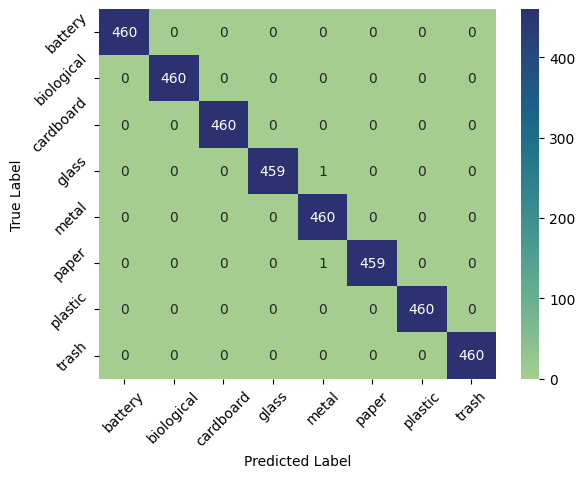

In [8]:
# Load model
model = tf.keras.models.load_model('models/MobileNetv2_model.h5')

# Accuracy, Precison, Recall and F1 Score
print('Evaluating the model on the train data...')
y_pred = model.predict(X_train)
y_pred = np.argmax(y_pred, axis=1)
print(classification_report(np.argmax(y_train, axis=1), y_pred))

# Confusion Matrix
print('Confusion Matrix: ')
cm = confusion_matrix(np.argmax(y_train, axis=1), y_pred)
cm = sns.heatmap(cm, annot=True, cmap='crest', fmt='d')
cm.set_xticklabels(class_names, rotation=45)
cm.set_yticklabels(class_names, rotation=45)
cm.set_xlabel('Predicted Label')
cm.set_ylabel('True Label')

plt.show()

Evaluating the model on the test data...
26/26 [==============================] - 2s 27ms/step
              precision    recall  f1-score   support

           0       1.00      1.00      1.00       169
           1       1.00      1.00      1.00       219
           2       0.94      0.90      0.92        70
           3       0.80      0.89      0.84        82
           4       0.79      0.91      0.85        68
           5       0.90      0.92      0.91       108
           6       0.82      0.74      0.78        74
           7       0.94      0.59      0.72        29

    accuracy                           0.92       819
   macro avg       0.90      0.87      0.88       819
weighted avg       0.93      0.92      0.92       819

Confusion Matrix: 


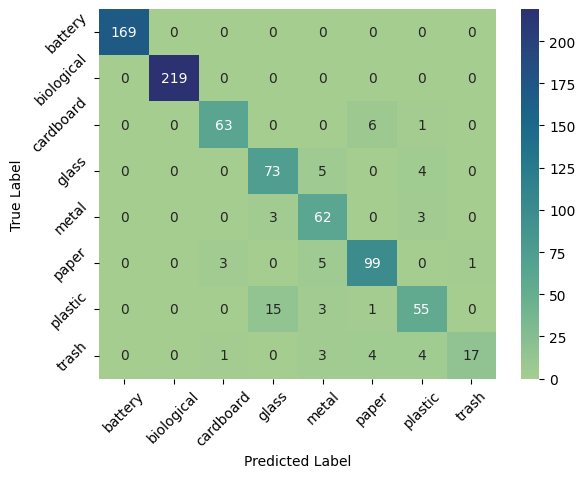

In [9]:
# Evaluate the model on the test data
# Accuracy, Precision, Recall and F1 Score
print('Evaluating the model on the test data...')
y_pred = model.predict(X_test)
y_pred = np.argmax(y_pred, axis=1)
print(classification_report(np.argmax(y_test, axis=1), y_pred))

# Confusion Matrix
print('Confusion Matrix: ')
cm = confusion_matrix(np.argmax(y_test, axis=1), y_pred)
cm = sns.heatmap(cm, annot=True, cmap='crest', fmt='d')
cm.set_xticklabels(class_names, rotation=45)
cm.set_yticklabels(class_names, rotation=45)
cm.set_xlabel('Predicted Label')
cm.set_ylabel('True Label')

plt.show()

In [16]:
# plot image in a grid
def plot_image(i, predictions_array, true_label, img):
  true_label = np.argmax(true_label, axis=1)
  # predictions_array, true_label, img = predictions_array[i], true_label[i], img[i]
  predictions_array = predictions_array[i]
  true_label = true_label[i]
  img = img[i]
  plt.grid(False)
  plt.xticks([])
  plt.yticks([])
  
  plt.imshow(img, cmap=plt.cm.binary)

  predicted_label = np.argmax(predictions_array)
  if predicted_label == true_label:
    color = 'blue'
  else:
    color = 'red'
  
  plt.xlabel("{} {:2.0f}% ({})".format(class_names[predicted_label],
                                100*np.max(predictions_array),
                                class_names[true_label]),
                                color=color)
# plot the value array    
def plot_value_array(i, predictions_array, true_label):
    true_label = np.argmax(true_label, axis=1)
    predictions_array, true_label = predictions_array[i], true_label[i]
    plt.grid(False)
    plt.xticks([])
    plt.yticks([])
    thisplot= plt.bar(range(8), predictions_array, color="#777777")
    plt.ylim([0,1])
    predicted_label = np.argmax(predictions_array)
    
    thisplot[predicted_label].set_color('red')
    thisplot[true_label].set_color('blue')

26/26 [==============================] - 1s 21ms/step


C:\Users\sudak\AppData\Local\Temp\ipykernel_27168\919974737.py:11: MatplotlibDeprecationWarning: Auto-removal of overlapping axes is deprecated since 3.6 and will be removed two minor releases later; explicitly call ax.remove() as needed.
  plt.subplot(num_rows, 2*num_cols, 2*i+1)


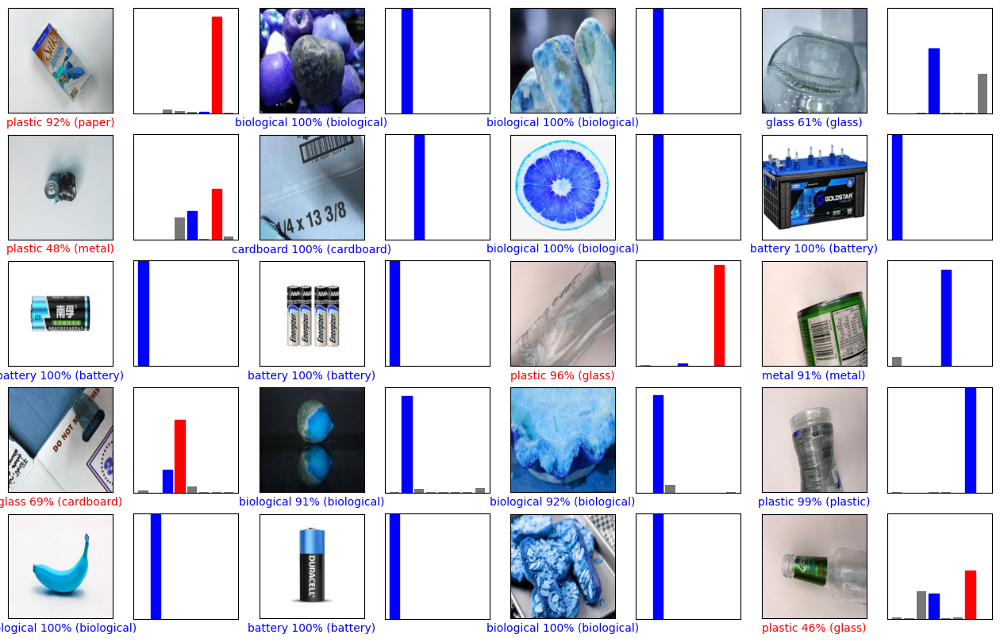

In [17]:
# Plot the first 20 test images, their predicted label, and the true label
# Color correct predictions in blue, incorrect predictions in red
predictions = model.predict(X_test)
num_rows = 5
num_cols = 4
num_images = num_rows*num_cols
plt.figure(figsize=(2*2*num_cols, 2*num_rows))
plt.title("15 Random Images from the Test Set")

for i in range(num_images):
    plt.subplot(num_rows, 2*num_cols, 2*i+1)
    r_num = np.random.randint(low=0, high=len(np.argmax(y_test, axis=1)))
    plot_image(r_num, predictions, y_test, X_test)
    plt.subplot(num_rows, 2*num_cols, 2*i+2)
    plot_value_array(r_num, predictions, y_test)

## **Task 2 (C Task) Analyse and improve the model**

### Task 2.1 Build an input pipeline for data augmentation


Build a data preprocessing pipeline to perform data augmentation. (You may use Keras ImageDataGenerator or write your own transformations.)

- Report the model performance with the pipeline added. How much performance gain have you achieved?    

- Profile your input pipeline to identify the most time-consuming operation. What actions have you taken to address that slow operation? (*Hint: You may use a profiler such as the [TensorFlow Profiler](https://github.com/tensorflow/profiler).*)


### Task 2.2 Compare the performance under equal training time

You may notice that with your pipeline, the model performance improves, but at the cost of a longer training time per epoch. Is the additional training time well spent? Compare the dynamic of model performance (e.g., classification accuracy on the test data) with and without data augmentation, when equal training time is spent in the two scenarios. 

### Task 2.3 Identifying model strength and weakness

Identify images that are incorrectly classified by your model. Do they share something in common? How do you plan to improve the model's performance on those images?

### Task 2.1 Build a data preprocessing pipeline

In [1]:
# Custom Preprocessing Pipeline
def preprocess_data_from_dir(dir, IMAGE_SIZE=224, smote=False):
    X = []
    y = []

    for class_name in os.listdir(dir):
        class_dir = os.path.join(dir, class_name)
        for image_name in os.listdir(class_dir):
            image_dir = os.path.join(class_dir, image_name)
            image = cv2.imread(image_dir)
            image = cv2.resize(image, (IMAGE_SIZE, IMAGE_SIZE))
            image = image / 255.0
            X.append(image)
            y.append(class_name)

    X = np.array(X)

    if smote:
        sm = SMOTE(random_state=42)
        X, y = sm.fit_resample(X.reshape(X.shape[0], -1), y)
        X = X.reshape(X.shape[0], IMAGE_SIZE, IMAGE_SIZE, 3)

    y = pd.get_dummies(y)

    return X, y

In [20]:
X_train_without_smote, y_train_without_smote = preprocess_data_from_dir(train_dir, smote=False)

In [42]:
# Clear the session
clear_session()

callback_1 = EarlyStopping(monitor='val_loss', patience=5, mode='auto')
callback_2 = EarlyStopping(monitor='val_accuracy', patience=5, mode='auto')

model.load_weights('models/Before_training.h5')

history = model.fit(
    X_train_without_smote, y_train_without_smote,
    validation_data = (X_valid, y_valid),
    batch_size = BATCH_SIZE,
    epochs = 30,
    callbacks = [callback_1, callback_2]
)

Epoch 1/30
322/322 [==============================] - 10s 20ms/step - loss: 1.4722 - accuracy: 0.4988 - val_loss: 1.0666 - val_accuracy: 0.6110
Epoch 2/30
322/322 [==============================] - 5s 16ms/step - loss: 1.0023 - accuracy: 0.6354 - val_loss: 0.8403 - val_accuracy: 0.7002
Epoch 3/30
322/322 [==============================] - 5s 17ms/step - loss: 0.8090 - accuracy: 0.7089 - val_loss: 0.8398 - val_accuracy: 0.7438
Epoch 4/30
322/322 [==============================] - 5s 16ms/step - loss: 0.6069 - accuracy: 0.7763 - val_loss: 0.6637 - val_accuracy: 0.7780
Epoch 5/30
322/322 [==============================] - 5s 15ms/step - loss: 0.5348 - accuracy: 0.8113 - val_loss: 0.7280 - val_accuracy: 0.7780
Epoch 6/30
322/322 [==============================] - 5s 16ms/step - loss: 0.4335 - accuracy: 0.8428 - val_loss: 0.6498 - val_accuracy: 0.7970
Epoch 7/30
322/322 [==============================] - 5s 17ms/step - loss: 0.3555 - accuracy: 0.8794 - val_loss: 0.5854 - val_accuracy: 0.812

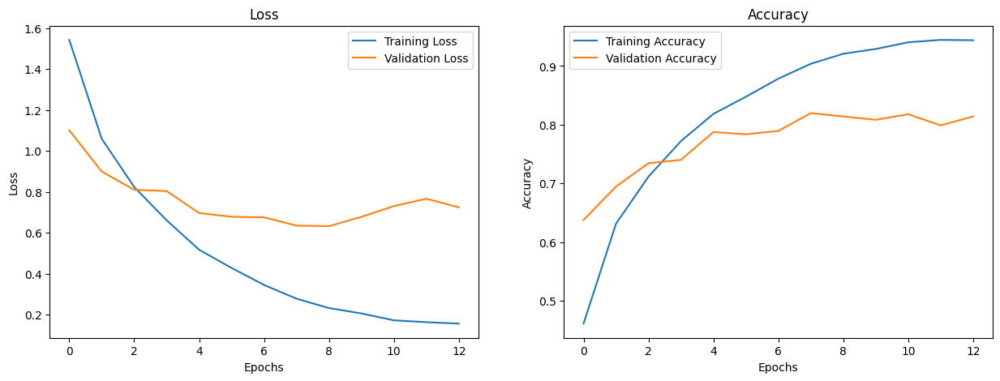

In [ ]:
# In case the images above don't load properly here's the matplotlib graphs
hist = pd.DataFrame(history.history)
hist['epoch'] = history.epoch

# Plotting the loss and accuracy
fig, ax = plt.subplots(1, 2, figsize=(15, 5))

sns.lineplot(x='epoch', y='loss', data=hist, label='Training Loss', ax = ax[0])
sns.lineplot(x='epoch', y='val_loss', data=hist, label='Validation Loss', ax = ax[0])
ax[0].set_title('Loss')
ax[0].set_xlabel('Epochs')
ax[0].set_ylabel('Loss')
ax[0].legend()

sns.lineplot(x='epoch', y='accuracy', data=hist, label='Training Accuracy', ax = ax[1])
sns.lineplot(x='epoch', y='val_accuracy', data=hist, label='Validation Accuracy', ax = ax[1])
ax[1].set_title('Accuracy')
ax[1].set_xlabel('Epochs')
ax[1].set_ylabel('Accuracy')
ax[1].legend()

In [44]:
# Let's compare classification reports
# Accuracy, Precison, Recall and F1 Score
print('Evaluating the model_without_smote on the test data...')
y_pred = model.predict(X_test)
y_pred = np.argmax(y_pred, axis=1)
print(classification_report(np.argmax(y_test, axis=1), y_pred))

print('Evaluating the model_with_smote on the test data...')
y_pred = model.predict(X_test)
y_pred = np.argmax(y_pred, axis=1)
print(classification_report(np.argmax(y_test, axis=1), y_pred))

Evaluating the model_without_smote on the test data...
26/26 [==============================] - 1s 34ms/step
              precision    recall  f1-score   support

           0       0.92      1.00      0.96       169
           1       0.89      1.00      0.94       219
           2       0.85      0.79      0.81        70
           3       0.73      0.60      0.66        82
           4       0.76      0.28      0.41        68
           5       0.82      0.80      0.81       108
           6       0.57      0.81      0.67        74
           7       0.73      0.55      0.63        29

    accuracy                           0.82       819
   macro avg       0.78      0.73      0.74       819
weighted avg       0.82      0.82      0.81       819

Evaluating the model_with_smote on the test data...
26/26 [==============================] - 1s 22ms/step
              precision    recall  f1-score   support

           0       0.97      0.99      0.98       169
           1       0.95  

As seen above

- Accuracy goes from 0.82 --> 0.84
- Precision (Weighted Average) goes from 0.82 --> 0.84
- Recall (Weighted Average) goes from 0.82 --> 0.84
- F1-Score (Weighted Average) goes from 0.81 --> 0.84

The performance gain is not significant, but it is still an improvement. The model is now able to classify waste items more accurately, which is the goal of this project.

26/26 [==============================] - 1s 22ms/step


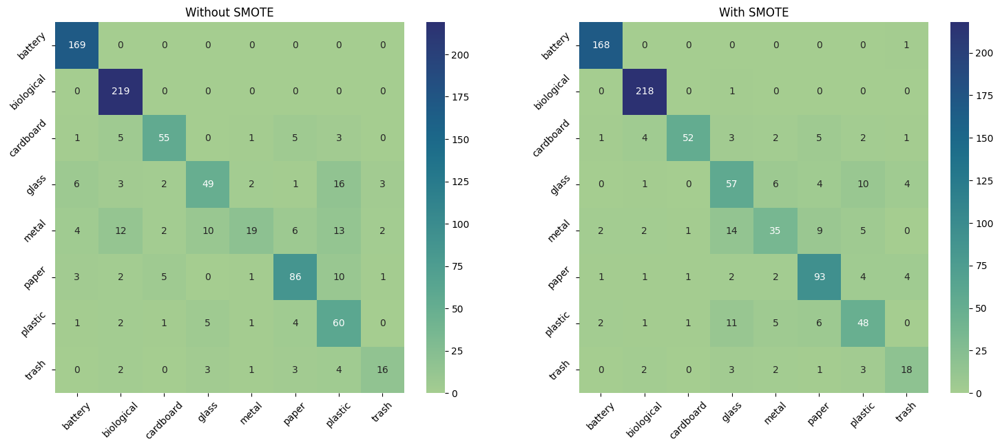

In [50]:
fig, ax = plt.subplots(1, 2, figsize=(18, 7))
y_pred = model.predict(X_test)
y_pred = np.argmax(y_pred, axis=1)
cm = confusion_matrix(np.argmax(y_test, axis=1), y_pred)
sns.heatmap(cm, annot=True, fmt='d', cmap='crest', ax=ax[0])
ax[0].set_title('Without SMOTE')
# Changing xticks and yticks
ax[0].set_xticklabels(class_names)
ax[0].set_yticklabels(class_names)
# Rotate the ticklabels
ax[0].tick_params(axis='x', rotation=45)
ax[0].tick_params(axis='y', rotation=45)

y_pred = model.predict(X_test)
y_pred = np.argmax(y_pred, axis=1)
cm = confusion_matrix(np.argmax(y_test, axis=1), y_pred)
sns.heatmap(cm, annot=True, fmt='d', cmap='crest', ax=ax[1])
ax[1].set_title('With SMOTE')
# Changing xticks and yticks
ax[1].set_xticklabels(class_names)
ax[1].set_yticklabels(class_names)
# Rotate the ticklabels
ax[1].tick_params(axis='x', rotation=45)
ax[1].tick_params(axis='y', rotation=45)

### Task 2.2: Compare Performance Under Equal Time

In [23]:
# Define time limit
time_limit = 1 * 60 # 1 min

# Both models will start from the same weight initialization
model.load_weights('models/Before_training.h5')

def timer_callback(model_name):
    model.stop_training = True
    model.save_weights(model_name + '.h5')
    print('Time limit exceeded, stopping training...')

timer_thread = threading.Timer(time_limit, timer_callback, args=['without_aug'])
timer_thread.start()

# Train the model
history = model.fit(
    X_train_without_smote, y_train_without_smote,
    validation_data = (X_valid, y_valid),
    batch_size = BATCH_SIZE,
    epochs = 30,
    callbacks = [callback_1, callback_2]
)

# Cancel the timer if the training stops before the time limit
timer_thread.cancel()

Epoch 1/30
322/322 [==============================] - 5s 16ms/step - loss: 1.6965 - accuracy: 0.4770 - val_loss: 1.0165 - val_accuracy: 0.6565
Epoch 2/30
322/322 [==============================] - 5s 14ms/step - loss: 1.0140 - accuracy: 0.6424 - val_loss: 0.8664 - val_accuracy: 0.7021
Epoch 3/30
322/322 [==============================] - 4s 14ms/step - loss: 0.8061 - accuracy: 0.7097 - val_loss: 0.7415 - val_accuracy: 0.7343
Epoch 4/30
322/322 [==============================] - 4s 13ms/step - loss: 0.6535 - accuracy: 0.7673 - val_loss: 0.8452 - val_accuracy: 0.7514
Epoch 5/30
322/322 [==============================] - 4s 13ms/step - loss: 0.5547 - accuracy: 0.8043 - val_loss: 0.6388 - val_accuracy: 0.7913
Epoch 6/30
322/322 [==============================] - 4s 13ms/step - loss: 0.4438 - accuracy: 0.8424 - val_loss: 0.7067 - val_accuracy: 0.7742
Epoch 7/30
322/322 [==============================] - 4s 13ms/step - loss: 0.4230 - accuracy: 0.8494 - val_loss: 0.5893 - val_accuracy: 0.8330

In [24]:
# Define time limit
time_limit = 1 * 60 # 1 min

# Both models will start from the same weight initialization
model.load_weights('models/Before_training.h5')

def timer_callback(model_name):
    model.stop_training = True
    model.save_weights(model_name + '.h5')
    print('Time limit exceeded, stopping training...')


timer_thread = threading.Timer(time_limit, timer_callback, args=['with_aug'])
timer_thread.start()

# Train the model
history = model.fit(
    X_train, y_train,
    validation_data = (X_valid, y_valid),
    batch_size = BATCH_SIZE,
    epochs = 30,
    callbacks = [callback_1, callback_2]
)

# Cancel the timer if the training stops before the time limit
timer_thread.cancel()

Epoch 1/30
460/460 [==============================] - 6s 13ms/step - loss: 1.7353 - accuracy: 0.4247 - val_loss: 1.2116 - val_accuracy: 0.5560
Epoch 2/30
460/460 [==============================] - 6s 12ms/step - loss: 1.1256 - accuracy: 0.5989 - val_loss: 0.9282 - val_accuracy: 0.6812
Epoch 3/30
460/460 [==============================] - 5s 12ms/step - loss: 0.8568 - accuracy: 0.7060 - val_loss: 0.8709 - val_accuracy: 0.7002
Epoch 4/30
460/460 [==============================] - 6s 12ms/step - loss: 0.7228 - accuracy: 0.7495 - val_loss: 0.7694 - val_accuracy: 0.7495
Epoch 5/30
460/460 [==============================] - 6s 12ms/step - loss: 0.5944 - accuracy: 0.7867 - val_loss: 0.7370 - val_accuracy: 0.7609
Epoch 6/30
460/460 [==============================] - 6s 12ms/step - loss: 0.5120 - accuracy: 0.8304 - val_loss: 0.6937 - val_accuracy: 0.7685
Epoch 7/30
460/460 [==============================] - 6s 13ms/step - loss: 0.4131 - accuracy: 0.8595 - val_loss: 0.7317 - val_accuracy: 0.7704

As observed above, the model which was training without augmentation was able to finish a little more than 13.48 epochs in 1 min. On the other hand, the model which was training with augmentation was able to finish a little more than 10.63 epochs in 1 min. This means that the model with augmentation is taking more time to train per epoch. However, the model with augmentation is able to achieve better performance than the model without augmentation if trained to completion. Therefore, the additional training time is well spent.

26/26 [==============================] - 1s 26ms/step


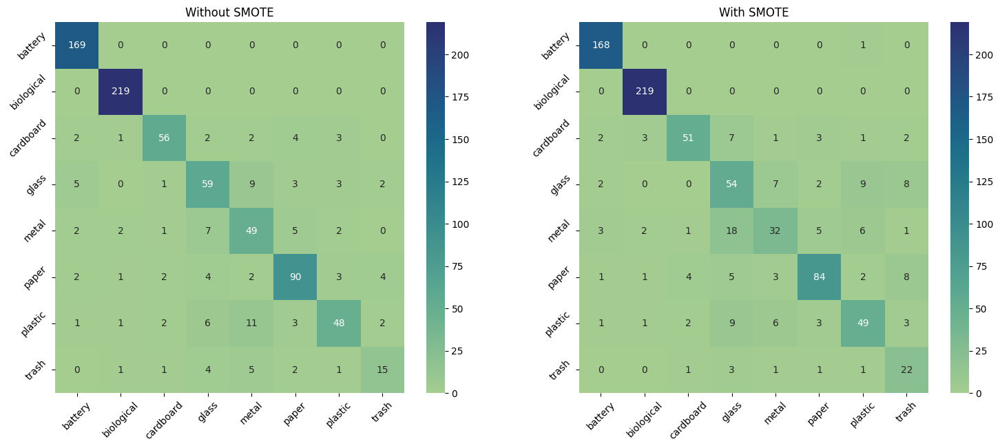

In [32]:
fig, ax = plt.subplots(1, 2, figsize=(18, 7))
model.load_weights('models/without_aug.h5')
y_pred = model.predict(X_test)
y_pred = np.argmax(y_pred, axis=1)
cm = confusion_matrix(np.argmax(y_test, axis=1), y_pred)
sns.heatmap(cm, annot=True, fmt='d', cmap='crest', ax=ax[0])
ax[0].set_title('Without SMOTE')
# Changing xticks and yticks
ax[0].set_xticklabels(class_names)
ax[0].set_yticklabels(class_names)
# Rotate the ticklabels
ax[0].tick_params(axis='x', rotation=45)
ax[0].tick_params(axis='y', rotation=45)

model.load_weights('models/with_aug.h5')
y_pred = model.predict(X_test)
y_pred = np.argmax(y_pred, axis=1)
cm = confusion_matrix(np.argmax(y_test, axis=1), y_pred)
sns.heatmap(cm, annot=True, fmt='d', cmap='crest', ax=ax[1])
ax[1].set_title('With SMOTE')
# Changing xticks and yticks
ax[1].set_xticklabels(class_names)
ax[1].set_yticklabels(class_names)
# Rotate the ticklabels
ax[1].tick_params(axis='x', rotation=45)
ax[1].tick_params(axis='y', rotation=45)

### Task 2.3 Identifying model strangth and weaknesses

26/26 [==============================] - 1s 30ms/step


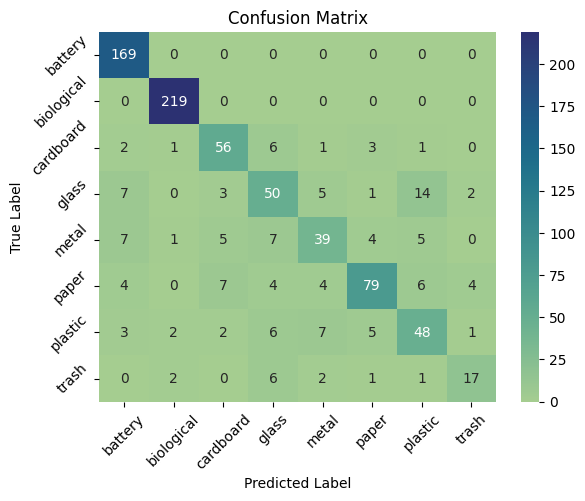

In [23]:
model.load_weights('models/MobileNetv2_model.h5')

# Plotting Confusion Matrix
y_pred = model.predict(X_test)
y_pred = np.argmax(y_pred, axis=1)
cm = confusion_matrix(np.argmax(y_test, axis=1), y_pred)
cm = sns.heatmap(cm, annot=True, fmt='d', cmap='crest')
cm.set_xticklabels(class_names, rotation=45)
cm.set_yticklabels(class_names, rotation=45)
cm.set_xlabel('Predicted Label')
cm.set_ylabel('True Label')
cm.set_title('Confusion Matrix')

plt.show()

From the confusion matrix, it can be seen that the model is struggling when classyfying the following:

Cut-off: >5%
- Cardboard
    - It predicts Paper as Cardboard ~9% (7/(0+0+56+3+5+7+2+0)) of the time
    - It predicts Metal as Cardboard ~6% (4/(0+0+56+3+5+7+2+0)) of the time
- Glass 
    - It predicts Metal as Glass ~8% (7/(0+0+6+50+7+4+6+6)) of the time
    - It predicts Cardboard, Plastic, and Trash as Glass ~6% (5/(0+0+6+50+7+4+6+6)) of the time
- Metal 
    - It predicts Plastic as Metal ~12% (7/(0+0+1+5+39+4+7+2)) of the time
    - It predicts Glass as Metal ~8% (6/(0+0+1+5+39+4+7+2)) of the time
- Plastic
    - It predicts Glass as Plastic ~19% (14/(0+0+1+14+5+6+48+1)) of the time
- Trash
    - It predicts Paper as Trash ~16% (4/(0+0+0+2+0+4+1+17)) of the time
    - It predicts Glass as Trash ~8% (2/(0+0+0+2+0+4+1+17)) of the time 

26/26 [==============================] - 1s 29ms/step


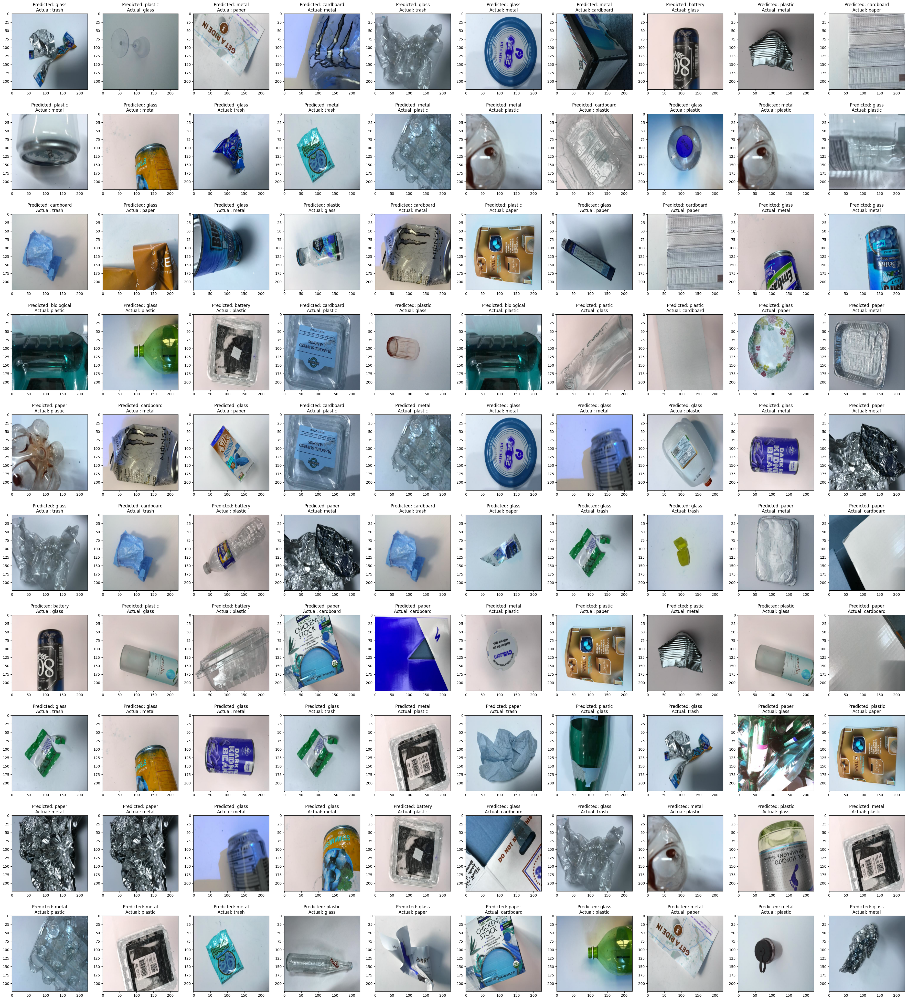

In [31]:
model.load_weights('models/MobileNetv2_model.h5')

# Plotting incorrect predictions
fig, ax = plt.subplots(8, 5, figsize=(45, 50))
y_pred = model.predict(X_test)
y_pred = np.argmax(y_pred, axis=1)
i = 0
while i < 40:
    r = np.random.randint(low=0, high=len(X_test))
    if np.argmax(y_test, axis=1)[r] != y_pred[r]:
        ax[int(i/10), i%10].imshow(X_test[r])
        ax[int(i/10), i%10].set_title('Predicted: ' + class_names[y_pred[r]] + '\nActual: ' + class_names[np.argmax(y_test, axis=1)[r]])
        i += 1

## **Task 3 (D Task) Improve model generalisability across domains**

So far, you have used training and test images from the same source (via random data split). Now collect new test images from a different source. For example, you may take some photos yourself if you used downloaded images before.
Otherwise, you may take new photos using a different mobile phone or against a different background.

Show sample images from the original test data and the newly collected test data. In what ways are they different?

Feed the new test data into your model. Report the performance change.

Improve your model so that it generalises better on unseen test images.

In [2]:
X_test, y_test = preprocess_data_from_dir(new_test, smote=False)

NameError: name 'new_test' is not defined

I've manually made an entirely new dataset by saving images from google images here. I've called this the new_test dataset.

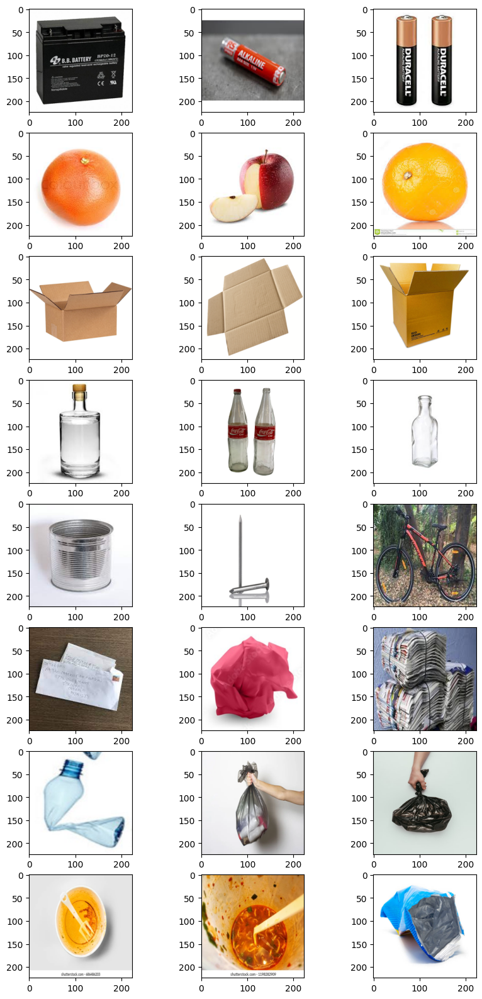

In [47]:
# Plot 5 random images from the training dataset for each class
fig, ax = plt.subplots(8, 3, figsize=(10, 20))

for class_name in os.listdir(new_test):
    waste_class = os.path.join(new_test, class_name)
    rand_imgs = np.random.randint(0, len(os.listdir(waste_class))-1, size=3)
    for i in rand_imgs:
        img = Image.open(os.path.join(waste_class, os.listdir(waste_class)[i]))
        img = img.resize((IMAGE_SIZE, IMAGE_SIZE))
        ax[list(os.listdir(new_test)).index(class_name), rand_imgs.tolist().index(i)].imshow(img)

In [12]:
y_pred = model.predict(X_test)
y_pred = np.argmax(y_pred, axis=1)
print(classification_report(np.argmax(y_test, axis=1), y_pred))

4/4 [==============================] - 10s 29ms/step
              precision    recall  f1-score   support

           0       0.25      0.06      0.10        16
           1       0.00      0.00      0.00        25
           2       0.08      0.20      0.11        15
           3       0.00      0.00      0.00        14
           4       0.17      0.20      0.18        15
           5       0.00      0.00      0.00        15
           6       0.12      0.54      0.19        13
           7       0.00      0.00      0.00        12

    accuracy                           0.11       125
   macro avg       0.08      0.13      0.07       125
weighted avg       0.07      0.11      0.07       125



c:\Users\sudak\anaconda3\envs\tf\lib\site-packages\sklearn\metrics\_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
c:\Users\sudak\anaconda3\envs\tf\lib\site-packages\sklearn\metrics\_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
c:\Users\sudak\anaconda3\envs\tf\lib\site-packages\sklearn\metrics\_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


## **Task 4 (HD Task) Build a workable prototype**

Build a web/mobile app that people from your city council can use to determine what to recycle. Test your prototype with the target users and report their feedback.

Upload your code into a GitHub repository.

Create a short video presentation about your product.

In [1]:
import streamlit as st

from ipywidgets import interact_manual
from PIL import Image


def preprocess_image(image):
    image = image.resize((IMAGE_SIZE, IMAGE_SIZE))
    image = np.array(image)
    image = image.reshape(1, IMAGE_SIZE, IMAGE_SIZE, 3)
    return image

def classify_waste(image, class_names):
    image = preprocess_image(image)
    model = tf.keras.models.load_model('models/MobileNetv2_model.h5')
    y_pred = model.predict(image)
    confidence = y_pred[0][np.argmax(y_pred, axis=1)]
    y_pred = class_names[np.argmax(y_pred, axis=1)]
    return y_pred, confidence

def app():
    uploaded_file = st.file_uploader("Choose an image")
    if uploaded_file is not None:
        image = Image.open(uploaded_file)
        st.image(image, caption='Uploaded Image', use_column_width=True)

        # Classify the image
        label, confidence = classify_waste(image, class_names)
        st.write('Class: ', label)
        st.write('Confidence: ', confidence)

def run_app():
    app()

interact_manual(app)

interactive(children=(Button(description='Run Interact', style=ButtonStyle()), Output()), _dom_classes=('widge…

<function __main__.app()>

---
**END OF ASSIGNMENT TWO**